Author:  
Manuel Eugenio Morocho Cayamcela, PhD

# **Lecture**
## The importance of scaling, balancing, and normalizing data

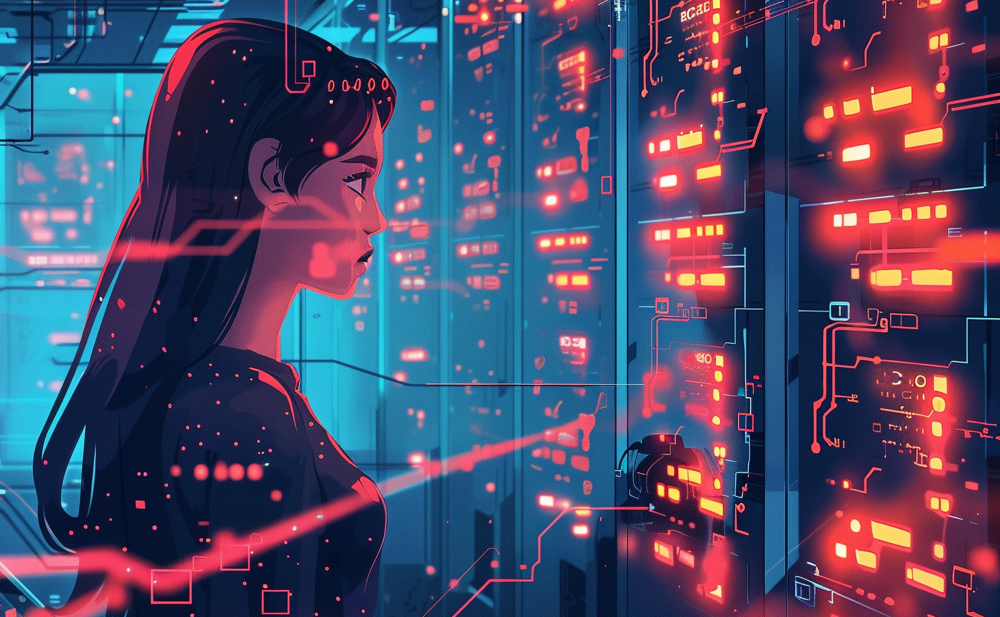

### Difference Between Scaling, Normalization, and Balancing in Data Science

In data science, **scaling**, **normalization**, and **balancing** are different techniques used to preprocess data before feeding it into machine learning models. Here's a breakdown of each concept:

#### 1. Scaling/Normalization
- **Definition**: Scaling refers to adjusting the range of feature values so that they fall within a specific range, typically between 0 and 1.
- **Purpose**: To ensure that all features contribute equally to the model's performance. Some machine learning algorithms (e.g., k-nearest neighbors, support vector machines, and gradient descent-based algorithms) are sensitive to the scale of the input features.
- **Methods**:
  - **Min-Max Scaling**: Transforms features to a fixed range, typically [0, 1].

    $
    X_{\text{scaled}} = \frac{X - X_{\min}}{X_{\max} - X_{\min}}
    $

- **Example**:  
  Suppose you have a dataset with two features: `Height (cm)` and `Weight (kg)`.

  | Height (cm) | Weight (kg) |
  |-------------|-------------|
  | 150         | 70          |
  | 160         | 80          |
  | 170         | 60          |
  | 180         | 90          |

  If you apply **Min-Max Scaling** on `Height`, where $X_{\min} = 150$ and $X_{\max} = 180$, a value of 170 would be scaled to:

  $
  \text{Height}_{\text{scaled}} = \frac{170 - 150}{180 - 150} = \frac{20}{30} = 0.67
  $

  After scaling, the new range for `Height` and `Weight` will be [0, 1].

#### 2. Standarization
- **Definition**: Standarization often refers to scaling individual samples (rows) to have a unit norm. It can also refer to transforming the data to make it conform to a normal distribution.
- **Purpose**: To adjust the data distribution or ensure that data points (in cases like text data) lie on the same scale for distance-based algorithms (e.g., cosine similarity).
- **Methods**:

  - **Z-Score Standarization**: Centers the features by removing the mean and scales them to unit variance.

    $
    X_{\text{standardized}} = \frac{X - \mu}{\sigma}
    $

    where $\mu$ is the mean and $\sigma$ is the standard deviation.

  - **L1 Normalization**: Scales the data such that the sum of absolute values is 1.

    $
    X_{\text{normalized}} = \frac{X}{\sum |X|}
    $

  - **L2 Normalization**: Scales the data such that the Euclidean norm (sum of squared values) is 1.

    $
    X_{\text{normalized}} = \frac{X}{\sqrt{\sum X^2}}
    $

  - **Log Transformation**: Reduces skewness and makes data more normally distributed.
  - **Box-Cox Transformation**: Makes the data more Gaussian-like.

- **Example**:  
  Given a data point `[4, 1, 2, 2]`, applying **L2 normalization**:

  $
  \text{L2 norm} = \sqrt{4^2 + 1^2 + 2^2 + 2^2} = \sqrt{16 + 1 + 4 + 4} = \sqrt{25} = 5
  $

  The normalized data point becomes `[4/5, 1/5, 2/5, 2/5] = [0.8, 0.2, 0.4, 0.4]`.

  **When to Apply**: Normalization is useful in algorithms that calculate distances between data points (e.g., k-nearest neighbors, k-means clustering) where features need to be on a comparable scale.

#### Standarization vs. Normalization

| Algoritmo                          | ¿Requiere escalado? | ¿Cuál usar?                  | Justificación                                                                 |
|-----------------------------------|----------------------|------------------------------|-------------------------------------------------------------------------------|
| Regresión lineal                  | Sí                   | `StandardScaler`            | Supone relaciones lineales y se ve afectado por magnitudes distintas.        |
| Regresión logística               | Sí                   | `StandardScaler`            | Similar a la regresión lineal, especialmente si hay regularización.          |
| SVM (máquinas de soporte vectorial) | Sí                | `StandardScaler`            | Muy sensible a la escala por el cálculo de distancias.                       |
| K-Nearest Neighbors (KNN)         | Sí                   | `StandardScaler` o `MinMaxScaler` | Usa distancias; ambas técnicas funcionan.                            |
| K-Means                           | Sí                   | `MinMaxScaler`              | Distancias euclidianas; MinMax suele dar mejor convergencia.                 |
| Redes neuronales (MLP, etc.)      | Sí                   | `StandardScaler` o `MinMaxScaler` | Mejora la velocidad de entrenamiento.                                |
| PCA (Análisis de Componentes Principales) | Sí         | `StandardScaler`            | Requiere que los datos tengan varianza comparable entre dimensiones.         |
| Árboles de decisión               | No                   | —                            | No se ve afectado por la escala.                                             |
| Random Forest                     | No                   | —                            | Igual que árboles de decisión.                                               |
| XGBoost / LightGBM / CatBoost     | No                   | —                            | Internamente robustos a escalas distintas.                                   |
| Naive Bayes                       | No                   | —                            | No requiere escalado; trabaja con probabilidades condicionales.              |
| Regresión de Ridge / Lasso        | Sí                   | `StandardScaler`            | La regularización depende de la escala de los coeficientes.                  |



#### 3. Balancing
- **Definition**: Balancing refers to adjusting the dataset to have an equal number of samples in each class, particularly for classification tasks where the data is imbalanced (e.g., 85% of samples belong to one class, 15% to another).
- **Purpose**: To prevent models from being biased towards the majority class and improve performance metrics like precision, recall, and F1-score.
- **Methods**:
  - **Undersampling**: Reduces the number of samples in the majority class.
  - **Oversampling**: Increases the number of samples in the minority class (e.g., SMOTE - Synthetic Minority Over-sampling Technique).
  - **Hybrid Methods**: Combine both undersampling and oversampling techniques.
  - **Cost-Sensitive Learning**: Modifies the learning algorithm to penalize misclassifications of the minority class more heavily.

- **Example**:  
  Consider a binary classification problem where you have 1000 samples: 850 belong to Class A (majority) and 150 belong to Class B (minority). If you apply **oversampling** using SMOTE, you can synthetically generate more samples of Class B to achieve a balanced dataset (e.g., 850 samples for each class).

  **When to Apply**: Balancing is crucial in applications like fraud detection, medical diagnosis, or spam detection, where the cost of misclassifying the minority class is high.

### Summary
- **Scaling** is about changing the range of values.
- **Normalization** adjusts the distribution or ensures consistency across samples.
- **Balancing** involves making the dataset more evenly distributed across classes.

### Introduction to the workshop
In this workshop, we will explore the importance of scaling, normalization, and balancing in data science. We will use the popular `Wine Quality` dataset, which is unscaled, unnormalized, and unbalanced. We will create a classifier model with the raw data and compare its metrics with the pre-processed data to see the differences.

### Dataset
The `Wine Quality` dataset is available in the UCI Machine Learning Repository. It contains various chemical properties of wines and their quality ratings.

### Steps
1. Load the dataset.
2. Create a classifier model with raw data.
3. Pre-process the data (scaling, normalization, and balancing).
4. Create a classifier model with pre-processed data.
5. Compare the metrics of both models.

### **Step 1:** Load the Dataset

In [1]:
%pip install scikit-learn
import sklearn
import pandas as pd

# Load the dataset
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv"
data = pd.read_csv(url, delimiter=';')

# Display the first few rows of the dataset
data.head()


[notice] A new release of pip is available: 26.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [2]:
# Show the unique values of the quality column
data['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [3]:
data['quality'].value_counts()

quality
5    681
6    638
7    199
4     53
8     18
3     10
Name: count, dtype: int64

### **Step 2:** Create a Classifier Model with Raw Data (no pre-processing) - Control Test

/Users/eugenio/Documents/Notebooks_ArtificialIntelligence/.venv/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/eugenio/Documents/Notebooks_ArtificialIntelligence/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", resul

Accuracy (Raw Data): 0.54375
Classification Report (Raw Data):
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        17
           5       0.60      0.72      0.65       195
           6       0.50      0.59      0.54       200
           7       0.25      0.02      0.03        61
           8       0.00      0.00      0.00         6

    accuracy                           0.54       480
   macro avg       0.22      0.22      0.20       480
weighted avg       0.48      0.54      0.50       480

Confusion Matrix (Raw Data):
 [[  0   0   1   0   0   0]
 [  0   0  11   6   0   0]
 [  0   0 141  54   0   0]
 [  0   0  79 119   2   0]
 [  0   0   4  56   1   0]
 [  0   0   0   5   1   0]]


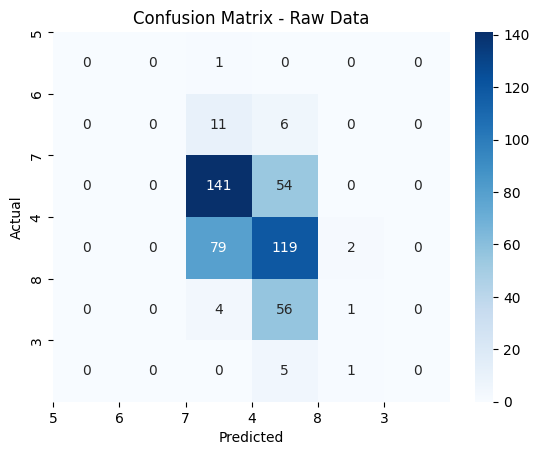

In [4]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Split the data into features and target
X = data.drop('quality', axis=1)
y = data['quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the classifier
clf = LogisticRegression(random_state=42)
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Evaluate the model
print("Accuracy (Raw Data):", accuracy_score(y_test, y_pred))
print("Classification Report (Raw Data):\n", classification_report(y_test, y_pred))
print("Confusion Matrix (Raw Data):\n", confusion_matrix(y_test, y_pred))

# Plot the heatmap of the confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='g') #fmt='g' to disable scientific notation
plt.xlabel('Predicted')
plt.ylabel('Actual')
xticks = range(len(data['quality'].unique()))
yticks = range(len(data['quality'].unique()))
plt.xticks(xticks, data['quality'].unique())
plt.yticks(yticks, data['quality'].unique())
plt.title('Confusion Matrix - Raw Data')
plt.show()

### **Step 3:** Pre-process the Data (Standarization, and Balancing)

#### Standarization

For this section, we'll use [`StandardScaler()`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html), to scale the data using the Z-score normalization (both at the same time) by removing the mean and scaling to Unit Variance"

This phase refers to a process in data preparation known as **feature standardization**. This process transforms the data so that it has a **mean of 0** and a **variance of 1**, which is useful in many machine learning algorithms that are sensitive to the scale of the data.

### Numerical Example

Suppose we have a dataset with a single feature consisting of 5 values:

$
X = [2, 4, 6, 8, 10]
$

**Step 1: Calculate the Mean**

The mean $\mu$ is calculated by summing all the values and dividing by the number of values:

$
\mu = \frac{2 + 4 + 6 + 8 + 10}{5} = 6
$

**Step 2: Subtract the Mean from Each Value**

Next, we subtract the mean from each value in the dataset:

$
X_{\text{centered}} = [2 - 6, 4 - 6, 6 - 6, 8 - 6, 10 - 6] = [-4, -2, 0, 2, 4]
$

Now the data is "centered" around 0.

**Step 3: Calculate the Standard Deviation**

The standard deviation $\sigma$ is calculated by taking the square root of the variance. The variance is the average of the squared differences between each value and the mean:

$
\sigma = \sqrt{\frac{(-4)^2 + (-2)^2 + 0^2 + 2^2 + 4^2}{5}} = \sqrt{\frac{16 + 4 + 0 + 4 + 16}{5}} = \sqrt{\frac{40}{5}} = \sqrt{8} \approx 2.83
$

**Step 4: Scale to Unit Variance**

Now, we divide each centered value by the standard deviation to scale the variance to 1:

$
X_{\text{scaled}} = \left[\frac{-4}{2.83}, \frac{-2}{2.83}, \frac{0}{2.83}, \frac{2}{2.83}, \frac{4}{2.83}\right] \approx [-1.41, -0.71, 0, 0.71, 1.41]
$

### Result

The standardized dataset has a mean of 0 and a variance of 1:

- **Mean**: 0
- **Standard Deviation**: 1

### Importance of Standardization

This process is important in algorithms like k-Nearest Neighbors (k-NN), linear regression, and neural networks, where the magnitude of the features can influence the model's results. By standardizing, it ensures that all features contribute equally to the model's training process.

In [11]:
# Scale the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [12]:
# Show the first few rows of the scaled features
pd.DataFrame(X_train_scaled, columns=X.columns).head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.169536,-1.721071,0.459303,-0.454282,-0.503192,3.610972,0.909502,-0.401203,1.011807,1.226612,0.550057
1,2.446067,-0.401957,1.841055,-0.384209,-0.354641,-0.966099,-0.968038,1.099235,-2.106876,1.226612,-0.205175
2,-0.647680,0.037747,-0.001281,0.036226,-0.078761,-0.381792,0.939785,-0.205494,0.492026,0.297271,0.550057
3,-1.114661,0.752267,-0.973624,-0.314137,-0.906402,0.299899,0.031298,-1.020949,1.141752,-0.980573,0.927673
4,-0.472562,0.257600,-0.666568,-0.244064,-0.227312,1.078975,0.394693,-0.259857,-0.222672,-0.399735,-0.582790


In [13]:
# Create a logistic classifier and train it on the scaled data
clf_scaled = LogisticRegression(random_state=42)
clf_scaled.fit(X_train_scaled, y_train)

# Make predictions
y_pred_scaled = clf_scaled.predict(X_test_scaled)

# Evaluate the model
print("Accuracy (Scaled Data):", accuracy_score(y_test, y_pred_scaled))
print("Classification Report (Scaled Data):\n", classification_report(y_test, y_pred_scaled))

Accuracy (Scaled Data): 0.5645833333333333
Classification Report (Scaled Data):
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        17
           5       0.62      0.75      0.68       195
           6       0.53      0.55      0.54       200
           7       0.42      0.26      0.32        61
           8       0.00      0.00      0.00         6

    accuracy                           0.56       480
   macro avg       0.26      0.26      0.26       480
weighted avg       0.53      0.56      0.54       480



/Users/eugenio/Documents/Notebooks_ArtificialIntelligence/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/eugenio/Documents/Notebooks_ArtificialIntelligence/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/eugenio/Documents/Notebooks_ArtificialIntelligence/.venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_d

### Data Balancing (oversampling): **SMOTE**

SMOTE (Synthetic Minority Over-sampling Technique) should only be applied to the training data, not the test data. The purpose of SMOTE is to generate synthetic samples to balance the classes in the training set, which helps the model learn better. Applying SMOTE to the test data would lead to data leakage, as the synthetic samples would not represent real-world data and could artificially inflate the model's performance.

1. **Identify Minority Class Samples**:
   - Synthetic Minority Over-sampling TEchnique (SMOTE) first identifies the samples belonging to the minority class in the dataset.

2. **Select a Minority Class Sample**:
   - For each sample in the minority class, SMOTE selects one or more of its nearest neighbors from the same class. The number of neighbors is typically specified by the user (default is 5).

3. **Generate Synthetic Samples**:
   - For each selected minority class sample, SMOTE generates synthetic samples by interpolating between the sample and its nearest neighbors. This is done by taking a random point along the line segment joining the sample and its neighbor.
   - Mathematically, if $x_i$ is a minority class sample, and $x_{nn}$ is one of its nearest neighbors, a synthetic sample $x_{new}$ is generated as follows:

   $
   x_{new} = x_i + \lambda \times (x_{nn} - x_i)
   $

   where $\lambda$ is a random number between 0 and 1.

4. **Repeat for All Minority Class Samples**:
   - This process is repeated for all samples in the minority class until the desired level of balancing is achieved.

**Why is SMOTE applied only to the training data?**
1. **Preventing Data Leakage:** Applying SMOTE to the test set would introduce synthetic data and information that would not naturally occur, leading to overly optimistic performance metrics and data leakage.
2. **Maintaining Real-World Evaluation:** The goal of the test set is to evaluate how the model generalizes to unseen, real-world data. Altering the test set with synthetic samples would make the evaluation unreliable.

**Correct Workflow Using SMOTE:**

1. Split the data into training and test sets.
2. Apply SMOTE only to the training set to balance the classes.
3. Train your model on the SMOTE-augmented training data.
4. Evaluate the model on the untouched test set.

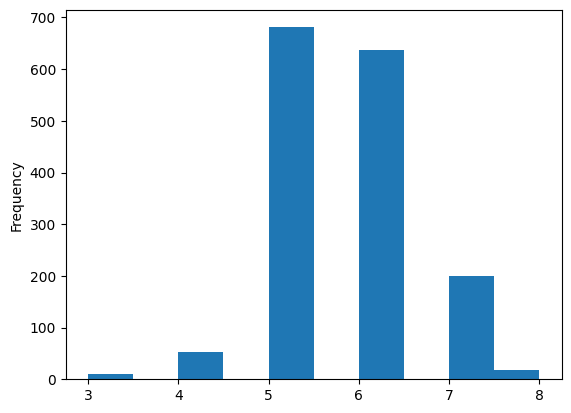

In [14]:
#plot the quality column as a histogram
import matplotlib.pyplot as plt

data['quality'].plot(kind='hist')
plt.show()

In [18]:
y_train.value_counts()

quality
5    486
6    438
7    138
4     36
8     12
3      9
Name: count, dtype: int64

In [19]:
# Install the imbalanced-learn package
%pip install imbalanced-learn

# Import the SMOTE module
from imblearn.over_sampling import SMOTE

# Apply SMOTE to balance the data
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_scaled, y_train)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [imbalanced-learn]

[notice] A new release of pip is available: 26.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [20]:
y_train_balanced.value_counts()

quality
7    486
5    486
6    486
3    486
8    486
4    486
Name: count, dtype: int64

### **Step 4:** Create a Classifier Model with Pre-processed Data

In [21]:
# Create and train the classifier with pre-processed data
clf_balanced = LogisticRegression(random_state=42)
clf_balanced.fit(X_train_balanced, y_train_balanced)

# Make predictions
y_pred_balanced = clf_balanced.predict(X_test_scaled)

# Evaluate the model
print("Accuracy (Pre-processed Data):", accuracy_score(y_test, y_pred_balanced))
print("Classification Report (Pre-processed Data):\n", classification_report(y_test, y_pred_balanced))

Accuracy (Pre-processed Data): 0.41458333333333336
Classification Report (Pre-processed Data):
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.13      0.65      0.21        17
           5       0.66      0.47      0.55       195
           6       0.59      0.34      0.43       200
           7       0.39      0.44      0.41        61
           8       0.06      0.50      0.10         6

    accuracy                           0.41       480
   macro avg       0.30      0.40      0.28       480
weighted avg       0.57      0.41      0.46       480



### Data Balancing (undersampling): **Random Undersampler**

The **RandomUnderSampler** is an undersampling technique used to handle **imbalanced datasets** by **randomly removing samples** from the majority class until classes are balanced.

### How it works
1. Identify the class distribution in `y_train`.
2. Randomly remove samples from the majority class.
3. Return a balanced dataset `(X_resampled, y_resampled)`.

In [22]:
from imblearn.under_sampling import RandomUnderSampler

under = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = under.fit_resample(X_train_scaled, y_train)

In [23]:
y_train_under.value_counts()

quality
3    9
4    9
5    9
6    9
7    9
8    9
Name: count, dtype: int64

In [24]:
# Create and train the classifier with undersampled dataed data
clf_under = LogisticRegression(random_state=42)
clf_under.fit(X_train_under, y_train_under)

# Make predictions
y_pred_under = clf_under.predict(X_test_scaled)

# Evaluate the model
print("Accuracy (Undersampled Data):", accuracy_score(y_test, y_pred_under))
print("Classification Report (Undersampled Data):\n", classification_report(y_test, y_pred_under))

Accuracy (Undersampled Data): 0.3729166666666667
Classification Report (Undersampled Data):
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.07      0.18      0.10        17
           5       0.56      0.45      0.50       195
           6       0.46      0.28      0.35       200
           7       0.42      0.46      0.44        61
           8       0.07      0.67      0.13         6

    accuracy                           0.37       480
   macro avg       0.26      0.34      0.25       480
weighted avg       0.47      0.37      0.41       480



### Data Balancing (oversampling and undersampling): **1. SMOTE, and then 2. Random Undersampler**

In [25]:
y_train.value_counts()

quality
5    486
6    438
7    138
4     36
8     12
3      9
Name: count, dtype: int64

In [26]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Paso 1: Oversampling parcial
smote = SMOTE(sampling_strategy = {3: 150, 8: 150, 4: 150, 7: 150}, random_state=42) # Aumentar la clase minoritaria a 150 ejemplos
X_sm, y_sm = smote.fit_resample(X_train_scaled, y_train)
y_sm.value_counts()

quality
5    486
6    438
7    150
3    150
8    150
4    150
Name: count, dtype: int64

In [27]:
# Paso 2: Undersampling para igualar
under = RandomUnderSampler(sampling_strategy='auto', random_state=42) # sampling_strategy='auto' iguala todas las clases
X_bal, y_bal = under.fit_resample(X_sm, y_sm)

In [28]:
y_bal.value_counts()

quality
3    150
4    150
5    150
6    150
7    150
8    150
Name: count, dtype: int64

In [29]:
# Create and train the classifier with pre-processed data
clf_balanced = LogisticRegression(random_state=42)
clf_balanced.fit(X_bal, y_bal)

# Make predictions
y_pred_balanced = clf_balanced.predict(X_test_scaled)

# Evaluate the model
print("Accuracy (Pre-processed Data):", accuracy_score(y_test, y_pred_balanced))
print("Classification Report (Pre-processed Data):\n", classification_report(y_test, y_pred_balanced))

Accuracy (Pre-processed Data): 0.40625
Classification Report (Pre-processed Data):
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.14      0.59      0.22        17
           5       0.63      0.47      0.54       195
           6       0.55      0.33      0.41       200
           7       0.36      0.39      0.38        61
           8       0.08      0.83      0.15         6

    accuracy                           0.41       480
   macro avg       0.30      0.43      0.28       480
weighted avg       0.54      0.41      0.45       480



## **Assignment:** Optimal Sampling Strategy

Choose a different dataset for classification.

Compare different `sampling_strategy` values using SMOTE or hybrid methods to find which one gives better model performance than the control model without preprocessing.

### Instructions

1. **Control test:**  
   Train and evaluate your model with the original imbalanced dataset (no resampling).

2. **Sampling tests:**  
   Apply at least **three different `sampling_strategy` settings** using SMOTE and Random Undersampler. You can also use SMOTE, SMOTEENN, or SMOTETomek.  
   For multi-class datasets, use a custom dictionary for `sampling_strategy`.

3. **Comparison:**  
   - Record metrics for all tests (accuracy, precision, recall, F1-score).  
   - Identify which configuration performs best and briefly explain why.

4. **Report:**  
   In the same notebook, include a short Markdown section summarizing:
   - Control results  
   - Sampling results  
   - Final conclusion (max. 5 lines)

### Evaluation Rubric (10 points)

| Criterion | Description | Points |
|------------|--------------|--------|
| **1. Control test** | Model trained and evaluated without resampling | **2 pts** |
| **2. Sampling implementation** | At least three strategies correctly tested | **3 pts** |
| **3. Metrics comparison** | Clear table or plot comparing results | **2 pts** |
| **4. Conclusion** | Short, original interpretation of the best strategy | **2 pts** |
| **5. Presentation** | Well-organized notebook with readable Markdown | **1 pt** |

*Note:* Your explanations must be written in Markdown cells inside the Jupyter notebook. Avoid generic or AI-generated text — focus on your own reasoning about why the results differ.